### Binôme : Elie Saleh et Raphaël Brochenin

# Projet SDATA : Classification de données

#### Rappels des objectifs

L'objectif de ce projet est de résoudre trois problèmes autour de données prélevées via l'API de Spotify. Le premier est un problème de classification articulé autour des genres de musiques d'une base de données. Le deuxième est un problème de régression autour de la popularité de chaque musique sur une base de données indépendante du premier problème. Enfin le dernier problème est à propos de la mise en place d'une méthode de recommandation de musique sur une base de données bien plus grande que les deux autres.

#### Sommaire 

```Rappels des objectifs 

Sommaire 

L'importation des bibliothèques nécessaires à ce projet

    Exercice 1 : Le genre d'une musique - un problème de classification
        La description des données
        L'histogramme des genres et les diagrammes à barres de chaque variable 
        Traitement des données
        Visualisation des données avec les méthodes ACP et t-SNE
        Entraînement des différents modèles
        Soumission
        Conclusion

    Exercice 2 : La popularité d'une musique - un problème de régression
        La description des données
        Les diagrammes à barres des grandeurs numériques
        Le traitement des données
        La visualisation des données avec les méthodes ACP et t-SNE
        Entraînement des différents modèles
        Constat des prédictions
        Conclusion

    Exercice 3 : La recommandation de musique - un problème des plus proche voisins
        La description des données
        Traitement des données
        Visualisation des données avec les méthodes de l'ACP et du t-SNE
        La méthode de recommandation
        Conclusion

Conclusion

Il faudra créer à partir de la racine du répertoire qui contient ce fichier Jupyter, un répertoire "dataset".
Le répertoire "dataset" doit contenir les fichiers suivants : 
* spotify_dataset_train.csv
* spotify_dataset_test.csv
* spotify_dataset_subset.csv
* recommendation_spotify.csv

### L'importation des bibliothèques nécessaires à ce projet

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.manifold import TSNE
import datetime

from sklearn.decomposition import PCA, KernelPCA
from sklearn.preprocessing import LabelEncoder
from sklearn import svm
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import (
    ExtraTreesClassifier,
    RandomForestClassifier,
    RandomForestRegressor,
)
from sklearn.naive_bayes import CategoricalNB
from sklearn.linear_model import (
    SGDClassifier,
    LogisticRegression,
    Ridge,
    Lasso,
    LinearRegression,
    BayesianRidge,
    LogisticRegression,
    SGDRegressor,
)
from sklearn.preprocessing import StandardScaler, OrdinalEncoder
from sklearn.neural_network import MLPClassifier, MLPRegressor
from sklearn.linear_model import RidgeClassifier
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.cross_decomposition import PLSRegression
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.ensemble import (
    BaggingClassifier,
    StackingClassifier,
    GradientBoostingClassifier,
    AdaBoostClassifier,
)
from sklearn.metrics import (
    f1_score,
    mean_absolute_error,
    mean_squared_error,
    silhouette_score,
    confusion_matrix,
)
from sklearn.kernel_ridge import KernelRidge
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import KMeans, DBSCAN
from ast import literal_eval

/tmp/ipykernel_1535894/1754585836.py:2: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [2]:
## Pour entraîner les modèles d'apprentissage supervisé dans google colab
# from google.colab import drive
# drive.mount('/content/drive/')

## Exercice 1 : Le genre d'une musique - un problème de classification

Le but de cet exercice est de réaliser un modèle capable de classifier des genres de musique.
Nous travaillons dans cette partie avec les jeux de données suivants : **spotify_dataset_train.csv** et **spotify_dataset_test.csv**. 
spotify_dataset_train.csv décrit un ensemble de musique selon plusieurs caractéristiques comme la date de sortie, et des caractéristiques du son, ainsi qu'un genre. 
Tandis que spotify_dataset_test.csv ne présente pas de colonne de genre. Ce sera ce deuxième jeu de données qui va être classifié et dont les prédictions seront soumis sur MLS. 

Les différents genres de musique présents dans ces jeux de données sont les suivants :  r&b, rap, classical, salsa, edm, hip hop, trap, techno, jazz, metal, country, rock, reggae, latin, disco, soul, chanson, blues, dance, electro, punk, folk, pop.

Nous avons initialement entrepris le traitement, la complétion, la visualisation et l'analyse des données. Ensuite, nous nous sommes engagés dans la recherche de modèles capables de mieux généraliser le jeu de données d'entraînement en utilisant les meilleurs hyperparamètres, conformément à la métrique f1-score micro, et cela a été accompli à l'aide d'une recherche Grid Search.

#### La description des données

Avant de commencer à prétraiter et analyser les données, nous devons la télécharger et observer s'il y a des données manquantes ou des valeurs extrêmes selon chaque colonne.

In [3]:
## Téléchargement des données

# Sous Google Colab
# df_data=pd.read_csv("/content/drive/MyDrive/Colab_Notebooks/dataset/spotify_dataset_train.csv")
# df_test=pd.read_csv("/content/drive/MyDrive/Colab_Notebooks/dataset/spotify_dataset_test.csv")

# En local
df_data = pd.read_csv("./dataset/spotify_dataset_train.csv")
df_test = pd.read_csv("./dataset/spotify_dataset_test.csv")

In [4]:
# Une première vue rapide des données
df_data.head(5)

,release_date,explicit,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,genre
0,2015-06-23,False,38,0.509,0.8720,2,-5.170,1,0.0547,0.0396,0.000015,0.3310,0.4860,95.969,194375,4,country
1,2021-11-12,False,58,0.182,0.0377,11,-33.748,0,0.0391,0.9870,0.957000,0.0804,0.0923,100.482,241804,4,classical
2,2013-06-21,False,36,0.550,0.9410,0,-3.128,0,0.0849,0.0182,0.003750,0.3120,0.3510,145.006,260276,4,rap
3,2012-09-04,False,0,0.569,0.7190,6,-8.399,0,0.0663,0.8670,0.941000,0.1760,0.6430,145.118,165200,4,blues
4,2008,False,0,0.631,0.6610,8,-5.694,1,0.0558,0.0146,0.720000,0.3650,0.3300,130.004,245933,4,dance


In [5]:
# Une description succinte des données
df_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25492 entries, 0 to 25491
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   release_date      25492 non-null  object 
 1   explicit          25492 non-null  bool   
 2   popularity        25492 non-null  int64  
 3   danceability      25492 non-null  float64
 4   energy            25492 non-null  float64
 5   key               25492 non-null  int64  
 6   loudness          25492 non-null  float64
 7   mode              25492 non-null  int64  
 8   speechiness       25492 non-null  float64
 9   acousticness      25492 non-null  float64
 10  instrumentalness  25492 non-null  float64
 11  liveness          25492 non-null  float64
 12  valence           25492 non-null  float64
 13  tempo             25492 non-null  float64
 14  duration_ms       25492 non-null  int64  
 15  time_signature    25492 non-null  int64  
 16  genre             25492 non-null  object

On observe que l'ensemble des données est décrit par 16 colonnes, dont une de type string/date (release_date), deux de type booléen (l'une est un string, l'autre est un booléen), une de type string (genre), et le reste en integer ou float 64. En particulier, on remarque qu'après la description, ce jeu de données ne contient aucune valeur nulle.

Par la suite, nous avons souhaité examiner quelques métriques relatives à la distribution statistique des variables numériques, à l'exception des colonnes numériques booléennes et de celles représentant des grandeurs discrètes pour les musiques. Nous constatons généralement une faible variance dans ces colonnes (à l'exception de 'duration_ms' en raison de l'ordre de grandeur des données), ce qui indique qu'il y a peu ou pas de valeurs extrêmes dans les données numériques.

In [6]:
df_data.describe()

,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
count,25492.000000,25492.000000,25492.000000,25492.000000,25492.000000,25492.000000,25492.000000,25492.000000,25492.000000,25492.000000,25492.000000,25492.000000,2.549200e+04,25492.000000
mean,31.185784,0.600785,0.666671,5.319630,-7.827989,0.617841,0.098590,0.247458,0.121762,0.194426,0.517368,122.020427,2.357300e+05,3.949004
std,26.647985,0.167052,0.223217,3.577066,4.190793,0.485925,0.100955,0.298900,0.264749,0.160047,0.252768,28.000996,9.605836e+04,0.313024
min,0.000000,0.000000,0.000020,0.000000,-60.000000,0.000000,0.000000,0.000000,0.000000,0.008290,0.000000,0.000000,1.344000e+04,0.000000
25%,0.000000,0.494000,0.526000,2.000000,-9.618250,0.000000,0.038000,0.012900,0.000000,0.093475,0.318000,99.996000,1.833298e+05,4.000000
50%,33.000000,0.613000,0.700000,5.000000,-6.944500,1.000000,0.054400,0.098400,0.000099,0.129000,0.518000,123.130000,2.179200e+05,4.000000
75%,54.000000,0.723000,0.846000,8.000000,-5.047750,1.000000,0.111000,0.415000,0.031700,0.254000,0.721000,139.936000,2.656698e+05,4.000000
max,98.000000,0.988000,1.000000,11.000000,1.869000,1.000000,0.934000,0.996000,0.989000,0.988000,0.988000,244.613000,2.516987e+06,5.000000


On remarque qu'il n'y a pas de duplicas à l'intérieur de ce jeu de données.

In [7]:
df_data.duplicated().sum()

1

On vérifie s'il y a des valeurs NaN (Not a Number) dans les différentes colonnes de df_data. On constate que les données n'en contiennent pas.

In [8]:
df_data.isna().sum()

release_date        0
explicit            0
popularity          0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
duration_ms         0
time_signature      0
genre               0
dtype: int64

#### L'histogramme des genres et les diagrammes à barres de chaque variable

L'histogramme des genres de musiques met en évidence **qu'il y a un profond problème de déséquilibre de quantité de données entre les classes de genre de musique. En effet, on peut voir que dans ce jeu de données certaines classes sont beaucoup plus rare que d'autres**. Ainsi cela présenterait un problème pour la classification plus tard dans l'exercice. Nous mettrons en place des méthodes et des modèles qui permettent de réduire l'influence de ce phénomène.

<Axes: xlabel='genre', ylabel='count'>

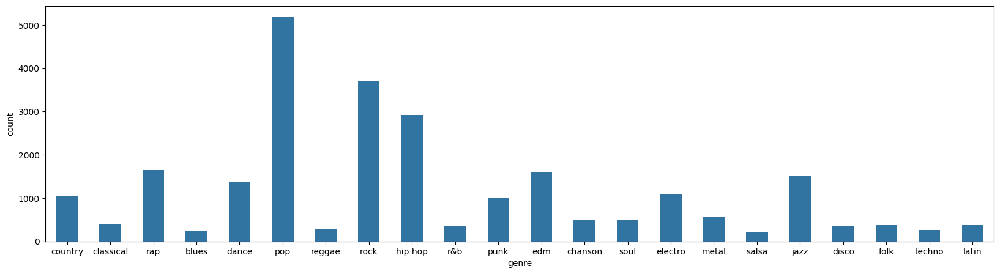

In [9]:
plt.figure(figsize=(20, 5))
sns.countplot(x="genre", data=df_data, width=0.5)

En observant les diagrammes à barres de quelques variables, on constate la présence d'outliers, et pour certaines variables, cette présence est très marquée. Cependant, nous ne retirerons pas ces colonnes, car la forte présence d'outliers pourrait être caractéristique de la sur-représentation d'une classe, telle que le rock ou la pop.

In [10]:
numerical_columns = [
    "danceability",
    "energy",
    "loudness",
    "speechiness",
    "acousticness",
    "instrumentalness",
    "liveness",
    "valence",
    "tempo",
]
for name in numerical_columns:
    fig = px.box(df_data[name], y=name, points="outliers")
    fig.show()

#### Traitement des données

Nous souhaitons maintenant prétraiter les données afin de faciliter l'apprentissage des données lors des calculs. Ce prétraitement pourrait éviter l'explosion des coûts de calcul, le ralentissement des entraînements et améliorer la performance des modèles. Tout d'abord, nous voulons traiter les dates de sortie. On observe dans les données que les dates de sortie peuvent avoir plusieurs formats ("%Y-%m-%d","%Y-%m","%Y"), ainsi nous les transformons en datetime UTC (coordinated universal time) ce qui permet de les considérer en tant qu'entier. Puis nous appliquons une normalisation MinMax qui permet de rassembler les dates dans [0,1]. La méthode MinMax effectue l'opération suivante : 

Pour une donnée  $ x_{i},$  
$$x^{norm}_{i}=\frac{x_{i}-min(X)}{max(X)-min(X)} $$ 

In [11]:
# Isolation de la colonne release_date
df_date = df_data[["release_date"]]

# Les différents formats de date
format1 = "%Y-%m-%d"
format2 = "%Y-%m"
format3 = "%Y"

# Traitement des dates de sortie selon le format et conversion en entier
for index, date in enumerate(df_date["release_date"]):
    if len(date) == len("YYYY-mm-dd"):
        df_date["release_date"][index] = (
            datetime.datetime.strptime(date, format1)
            .replace(tzinfo=datetime.timezone.utc)
            .timestamp()
        )
    elif len(date) == len("YYYY-mm"):
        df_date["release_date"][index] = (
            datetime.datetime.strptime(date, format2)
            .replace(tzinfo=datetime.timezone.utc)
            .timestamp()
        )
    elif len(date) == len("YYYY"):
        df_date["release_date"][index] = (
            datetime.datetime.strptime(date, format3)
            .replace(tzinfo=datetime.timezone.utc)
            .timestamp()
        )

# Reshape les données pour le MinMaxScaler
df_time = df_date
timestamps = df_time["release_date"].values.reshape(-1, 1)

# Application de MinMaxScaler et normalisation des timestamps entre 0 et 1
scaler = MinMaxScaler()
df_time["normalized_timestamp"] = scaler.fit_transform(timestamps)

# Remplacement des anciennes valeurs de la colonne release_date
df_data["release_date"] = df_time["normalized_timestamp"]

# On vérifie qu'après traitement des dates de sortie, nous n'avons toujours pas de données des NaN
df_time["release_date"].isna().sum()

/tmp/ipykernel_1535894/2559723845.py:12: FutureWarning:

ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


/tmp/ipykernel_1535894/2559723845.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in t

0

On traite le reste des colonnes. On transforme la colonne 'explicit', de type string, en booléen (0 et 1), et on normalise les autres données selon un StandardScaler. Cependant, on ne normalise pas toutes les colonnes, car si les colonnes sont pour la plupart décorrélées les unes des autres, la normalisation pourrait avoir un effet négatif pour certains modèles, tels que les RandomForest. Cette normalisation utilise la formule suivante :

Pour une donnée $x_{i}$ et une colonne j,

$$ x_{ij}^{norm}=\frac{x_{ij}-\mu_{j} }{\sigma_{j}} $$

In [12]:
# Binarisation de la colonne explicite
label_encoder_explicit = LabelEncoder().fit(df_data["explicit"])
df_data["explicit"] = label_encoder_explicit.transform(df_data["explicit"])

# On sélectionne les colonnes qui vont être prises en compte durant l'entraînement, dans notre cas il s'agit de toutes les colonnes
l_features_to_train = [
    "release_date",
    "explicit",
    "popularity",
    "danceability",
    "energy",
    "key",
    "loudness",
    "mode",
    "speechiness",
    "acousticness",
    "instrumentalness",
    "liveness",
    "valence",
    "tempo",
    "duration_ms",
    "time_signature",
]
l_feature_to_predict = ["genre"]

# On forme les données d'entraînement
y = df_data[l_feature_to_predict]
X = df_data[l_features_to_train]

# On normalise les données d'entraînement de seulement certaines colonnes
l_features_to_normalize_standardscaler = [
    "danceability",
    "energy",
    "loudness",
    "speechiness",
    "acousticness",
    "instrumentalness",
    "liveness",
    "valence",
    "tempo",
    "duration_ms",
]
X[l_features_to_normalize_standardscaler] = StandardScaler().fit_transform(
    X[l_features_to_normalize_standardscaler]
)

/tmp/ipykernel_1535894/3569819556.py:43: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [13]:
X

,release_date,explicit,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
0,0.946223,0,38,-0.549449,0.919883,2,0.634257,1,-0.434759,-0.695425,-0.459866,0.853352,-0.124100,-0.930393,-0.430528,4
1,0.998587,0,58,-2.506966,-2.817812,11,-6.185110,0,-0.589286,2.474258,3.154889,-0.712470,-1.681686,-0.769217,0.063234,4
2,0.929801,0,36,-0.304011,1.229005,0,1.121526,0,-0.135610,-0.767022,-0.445760,0.734635,-0.658198,0.820900,0.255537,4
3,0.923294,0,0,-0.190272,0.234437,6,-0.136256,0,-0.319854,2.072778,3.094454,-0.115133,0.497035,0.824900,-0.734256,4
4,0.884975,0,0,0.180878,-0.025405,8,0.509219,1,-0.423863,-0.779066,2.259685,1.065794,-0.741279,0.285123,0.106219,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25487,0.959011,0,30,-0.286053,0.144837,2,0.817281,1,-0.409995,1.510707,-0.459909,-0.592503,-1.152732,0.895006,-0.452619,4
25488,0.994975,0,8,-1.022366,1.439567,0,0.807975,0,0.588489,-0.827770,-0.436015,1.022056,-1.564185,0.999255,-0.428436,4
25489,0.963251,0,71,-0.579381,-0.052285,0,-0.194719,0,-0.439712,1.192868,-0.452635,1.059546,-1.010306,-0.787074,0.294993,4
25490,0.641173,0,27,-1.040325,0.955723,2,0.568875,1,-0.487259,-0.817910,-0.459918,0.191033,1.339722,1.332821,-1.386653,4


#### Visualisation des données avec les méthodes ACP et t-SNE

Nous souhaitons observer les tendances (i.e. corrélations) entre les colonnes. Pour cela, nous calculons la matrice de corrélation entre ces caractéristiques.

On définit une matrice de corrélation par : 

Soit $y_{i}$,$y_{j}$ deux colonnes de nombres réels: 
$$ M_{corr}[i][j] = \frac{Cov(y_{i},y_{j})}{\sigma_{i} * \sigma_{j}} $$ 

<Axes: >

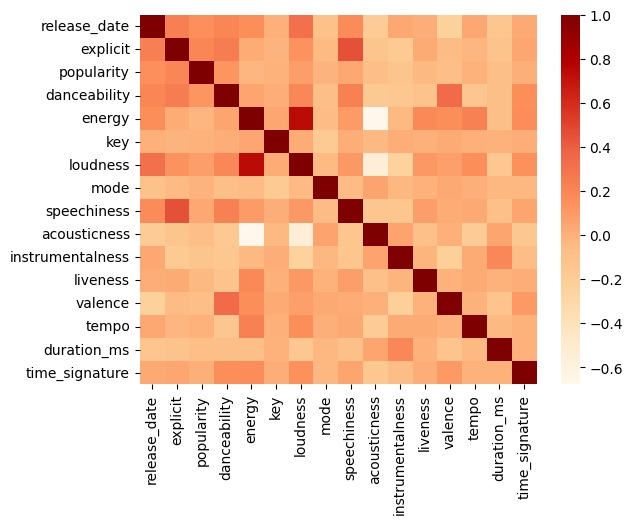

In [14]:
sns.heatmap(X.corr(), cmap="OrRd", annot=False)

On constate que la plupart des colonnes sont très proches d'être décorrélées les unes des autres, à l'exception de loudness avec energy.

Comme on peut le voir ci-dessous, il serait intéressant d'utiliser l'ACP (sur des données totalement normalisées) au vu de l'accumulation des parts d'inertie expliquée par chaque axe.
D'après la méthode du coude, de Kaiser et des proportions d'inertie, nous devrions projeter les données sur les 9 premiers axes de cette nouvelle base.

In [15]:
pca = PCA(n_components=16)
X_norm_scaler = StandardScaler().fit_transform(X)
pca.fit(X_norm_scaler)

pca.explained_variance_ratio_.cumsum()

array([0.17912764, 0.28894967, 0.38221125, 0.45841092, 0.52688187,
       0.59285694, 0.65226434, 0.7090534 , 0.76366642, 0.81459839,
       0.86338982, 0.90563954, 0.93762978, 0.96745794, 0.9900688 ,
       1.        ])

Cependant, au vu de la projection dans le premier plan principal, on ne pourra pas utiliser la projection des données via l'ACP (Analyse en Composantes Principales). En effet, cette méthode de projection de données suppose qu'il y a en amont une corrélation entre les caractéristiques des données pour construire une base décorrélée et mieux représentative des données. Ce n'est pas le cas ici, comme on peut le voir dans la figure ci-dessous où les groupes ne sont pas clairement identifiés et séparés par des frontières linéaires. Pour la suite de cette étude, nous opterons soit pour la projection à l'aide d'une méthode non-linéaire, soit pour l'utilisation des données prétraitées directement.

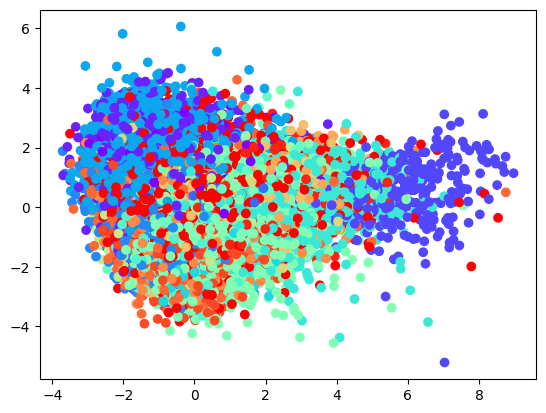

In [16]:
l_genre = [
    "r&b",
    "rap",
    "classical",
    "salsa",
    "edm",
    "hip hop",
    "trap",
    "techno",
    "jazz",
    "metal",
    "country",
    "rock",
    "reggae",
    "latin",
    "disco",
    "soul",
    "chanson",
    "blues",
    "dance",
    "electro",
    "punk",
    "folk",
    "pop",
]
l_colors = plt.cm.rainbow(np.linspace(0, 1, num=23))

len(l_genre), len(l_colors)
genre_to_color = dict(zip(l_genre, l_colors))

l_genre_data = y.to_numpy().flatten()

pca = PCA(n_components=2)
X_projected_2D_pca = pca.fit_transform(X_norm_scaler)

plt.scatter(
    X_projected_2D_pca[:, 0],
    X_projected_2D_pca[:, 1],
    c=[genre_to_color[l_genre_data[i]] for i in range(len(l_genre_data))],
)
plt.show()

Au regard de la méthode t-SNE, la situation ne s'améliore pas non plus, comme on peut le voir en projetant dans un espace vectoriel de deux dimensions. La méthode t-SNE parvient à regrouper des tendances de catégories de musique, mais n'arrive pas du tout à les séparer. Cela pourrait s'expliquer par le déséquilibre des classes, certaines étant plus représentées que d'autres, ou encore par la décorrélation de la majorité des colonnes.

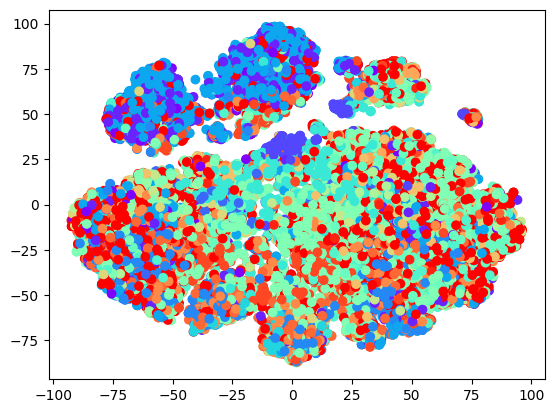

In [17]:
tsne = TSNE(n_components=2)

X_projected_2D_tsne = tsne.fit_transform(X_norm_scaler)

plt.scatter(
    X_projected_2D_tsne[:, 0],
    X_projected_2D_tsne[:, 1],
    c=[genre_to_color[l_genre_data[i]] for i in range(len(l_genre_data))],
)
plt.show()

Nous utiliserons par la suite les données venant de la matrice **X** sans aucune projection, car la projection en plus petites dimensions (linéaire ou non-linéaire) ne sépare pas suffisament les données de base.

#### Entraînement des différents modèles

En amont du choix et de l'entraînement des modèles, nous avons converti les données de sortie (i.e. targets) en des nombres pour effectuer l'entraînement de tous les modèles que l'on trouve pertinents. En effet, nous avons non seulement comme problème un déséquilibre du nombre d'éléments par classe mais aussi une décorrélation entre la plupart des classes. Ainsi des modèles adpatés sont les modèles type Bagging (comme RandomForest et ExtraTrees), une couche de réseau de neurones (MLP) et la descente de gradient stochastique (SGD). Nous avons aussi inclus des modèles plus linéaire comme un modèle RidgeClassifier et LogisticRegression pour mettre bien en évidence qu'il s'agit d'un problème non-linéaire.

Ainsi on estime qu'en amont les meilleurs performances seraient obtenues par les modèles MLP, RandomForest, ExtraTrees et SGD, car ils peuvent prendre en compte le déséquilibre entre les classes et ils sont moins sensibles aux données (i.e. la décorrélation des colonnes).

In [18]:
label_encoder_predict = LabelEncoder().fit(df_data[l_feature_to_predict])
y = label_encoder_predict.transform(y)

/home/j/.local/lib/python3.10/site-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/home/j/.local/lib/python3.10/site-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



In [19]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

##### La recherche automatique des meilleurs hyperparamètres

Pour chercher les hyperparamètres pour optimiser les modèles selon le f1-score, nous avons voulu les chercher via une méthode automatique (GridSearch). Nous avons sélectionné un ensemble d'hyperparamètres pour ces modèles. Par ailleurs, nous choisissions le paramètre **class_weight** lorsque l'on avait l'occasion, afin de diminuer l'influence du **déséquilibre des classes**. Tandis que pour d'autres hyperparamètres, nous les sélectionnions selon la littérature.

In [20]:
# L'ensemble des modèles testés
modeles = [
    # ('RidgeClassifier', RidgeClassifier(), {'alpha': [1, 5, 10], 'class_weight': ['balanced'], 'solver': ['lsqr', 'saga']}),
    # ('LogisticRegression', LogisticRegression(), {'C': [1, 5, 10], 'class_weight': ['balanced'], 'solver': ['newton-cg', 'saga']}),
    # ('MLPClassifier', MLPClassifier(), {'activation': ['relu', 'tanh'], 'solver': ['adam'], 'alpha': [10e-4, 10e-5], 'learning_rate': ['constant', 'adaptive']}),
    # ('RandomForest' , RandomForestClassifier() , {'n_estimators' : [400,500] , 'criterion' : ['gini','entropy'] , 'max_depth' : [30,50,100] , 'class_weight' : ['balanced']}),
    # ('SGD' , SGDClassifier() , {'loss' : ['squared_hinge' , 'perceptron'] , 'penalty' : ['l2' ,'elasticnet'] , 'alpha' : [ 0.0001 , 0.001] , 'class_weight' : ['balanced']}),
    # ('ExtraTreesClassifier', ExtraTreesClassifier(), {'class_weight': ['balanced'], 'criterion': ['log_loss', 'gini', 'entropy'], 'max_depth': [30, 50, 100], 'n_estimators': [300, 400, 500]})
]

In [21]:
for nomModele, modele, param_grid in modeles:
    print(f"Entraînement et optimisation de {nomModele}...")

    # Recherche des meilleurs hyperparamètres par grid search
    grid_search = GridSearchCV(modele, param_grid, n_jobs=15)
    grid_search.fit(X_train, y_train)

    # Récupérations du modèle avec les meilleurs hyperparamètres
    meilleurModele = grid_search.best_estimator_

    # Réalisation d'une prédiction
    y_pred = meilleurModele.predict(X_test)

    # Evaluation du modèle
    f1 = f1_score(y_test, y_pred, average="micro", zero_division="warn")

    # Affichage des résultats
    print(f"Model: {nomModele}")
    print(f"Best Hyperparameters: {grid_search.best_params_}")
    print(f"F1-score: {f1}")
    print("------------------------------------")

Résultats des modèles de classification
|Model               |Best Hyperparameters                                                                       |F1-Score            |
|--------------------|-------------------------------------------------------------------------------------------|--------------------|
|RidgeClassifier     |{'alpha': 5, 'class_weight': 'balanced', 'solver': 'lsqr'}                                 |0.2357324965679545  |
|LogisticRegression  |{'C': 10, 'class_weight': 'balanced', 'solver': 'newton-cg'}                               |0.30476564032163167 |
|MLPClassifier       |{'activation': 'tanh', 'alpha': 0.0001, 'learning_rate': 'constant', 'solver': 'adam'}     |0.44734261619925475 |
|```RandomForest```        |```{'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 100, 'n_estimators': 500}```   |```0.48460482447538733``` |
|SGD                 |{'alpha': 0.001, 'class_weight': 'balanced', 'loss': 'perceptron', 'penalty': 'elasticnet'}|0.3457540694253775  |
|ExtraTreesClassifier|{'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 30, 'n_estimators': 400}    |0.47401451264953914 |


Nous pouvons constater la cohérence des performances des modèles à la vue de la f1-score par rapport à ce que nous avons évoqué précédemment. Les modèles linéaires ont clairement une moins bonne performance que ceux adaptés à ce genre de données. Le meilleur modèle est le RandomForest avec un f1-score de 0.484 selon la configuration suivante :
- class_weight : balanced
- criterion : gini
- max_depth : 100
- n_estimators : 500

Ensuite, nous avons voulu rechercher un meilleur f1-score par des méthodes d'ensemble. L'idée est de reprendre **la configuration du meilleur modèle** et d'appliquer une méthode d'ensemble comme le Bagging, Boosting (AdaBoost pour du multiclasse) et le Stacking tout en recherchant les meilleurs hyperparamètres selon un espace d'état.

In [22]:
# les meilleurs modèles sont repris comme estimateurs
random_forest_estimator = RandomForestClassifier(
    class_weight="balanced", criterion="gini", max_depth=100, n_estimators=500
)
extra_trees_classifier_estimator = ExtraTreesClassifier(
    class_weight="balanced", criterion="gini", max_depth=30, n_estimators=400
)
mlp_estimator = MLPClassifier(
    activation="tanh", alpha=0.0001, learning_rate="constant", solver="adam"
)

estimators = [
    (
        "rdmfc",
        RandomForestClassifier(
            class_weight="balanced", criterion="gini", max_depth=100, n_estimators=500
        ),
    ),
    (
        "extratc",
        ExtraTreesClassifier(
            class_weight="balanced", criterion="gini", max_depth=30, n_estimators=400
        ),
    ),
]


modeles_ensemble = [
    # ('Ada Boost', AdaBoostClassifier(), {'n_estimators': [200], 'algorithm': ["SAMME"], 'estimator': [random_forest_estimator, extra_trees_classifier_estimator,mlp_estimator]}),
    # ('StackingClassifier', StackingClassifier(), {
    #        'estimators': [estimators]
    #        ,
    #        'final_estimator':[LogisticRegression(C=10, class_weight='balanced', solver='newton-cg')]
    #    }),
    # ('BaggingClassifier', BaggingClassifier(), {'estimator':[random_forest_estimator, extra_trees_classifier_estimator,mlp_estimator],'n_estimators':[4], 'random_state':[0]})
]

In [23]:
for nomModele, modele, param_grid in modeles_ensemble:
    print(f"Entraînement et optimisation de {nomModele}...")

    # Recherche des meilleurs hyperparamètres par grid search
    grid_search = GridSearchCV(modele, param_grid, n_jobs=10)
    grid_search.fit(X_train, y_train)

    # Récupérations du modèle avec les meilleurs hyperparamètres
    meilleurModele = grid_search.best_estimator_

    # Réalisation d'une prédiction
    y_pred = meilleurModele.predict(X_test)

    # Evaluation du modèle
    f1 = f1_score(y_test, y_pred, average="micro", zero_division="warn")

    # Affichage des résultats
    print(f"Model: {nomModele}")
    print(f"Best Hyperparameters: {grid_search.best_params_}")
    print(f"F1-score: {f1}")
    print("------------------------------------")

Résultats des méthodes d'ensemble
|Model ensemble      |Best Hyperparameters                                                                                                                      |F1-Score             |
|--------------------|------------------------------------------------------------------------------------------------------------------------------------------|---------------------|
|Ada Boost           |{'algorithm': 'SAMME', 'estimator': RandomForestClassifier(class_weight='balanced', max_depth=100, n_estimators=500) 'n_estimators': 200} |  0.48009413610511864|
|StackingClassifier  |{'estimators': [[("rdmfc",RandomForestClassifier(class_weight='balanced', criterion= 'gini', max_depth=100, n_estimators=500)),("extratc",ExtraTreesClassifier(class_weight='balanced', criterion= 'gini', max_depth=30, n_estimators=400))]], 'final_estimator': LogisticRegression(C=10, class_weight='balanced', solver='newton-cg')}|0.47244568126442582|
|BaggingClassifier   |Hyperparameters: {'estimator': RandomForestClassifier(class_weight='balanced', max_depth=100, n_estimators=500), 'n_estimators': 4, 'random_state': 0}|0.47009217493626225|

Nous constatons que malgrè des scores relativement élevés, nos méthodes d'ensemble n'ont pas pu avoir un meilleur score que celui du modèle RandomForest. En effet, RandomForest est déjà une méthode d'ensemble (Bagging) appliquée à des arbres de décisions. Ainsi appliquer un bagging avec des RandomForest peut accentuer l'overfitting de l'ensemble du modèle et baisser le score.

#### Soumission

Avec les meilleurs hyperparamètres de notre modèle RandomForest, nous devons fournir notre soumission à ce challenge sur des données dont le genre de musique est inconnu. Nous prétraitons de la même manière les données de spotify_dataset_test.csv. Puis nous utilisons notre meilleur modèle pour prédire les genres de musique et nous les enregistrons au format csv.

In [24]:
df_test.head(5)

,release_date,explicit,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
0,2018-03-16,True,83,0.699,0.304,1,-11.192,1,0.0993,0.77900,0.000993,0.1370,0.271,119.705,160184,4
1,2003,False,44,0.590,0.722,4,-5.783,1,0.0265,0.00052,0.000009,0.0712,0.670,116.035,166645,4
2,2012-01-01,False,0,0.362,0.435,2,-7.241,1,0.0280,0.27400,0.000001,0.1580,0.349,141.970,220693,4
3,2001-10-23,False,57,0.571,0.617,2,-5.032,1,0.0348,0.32800,0.000000,0.1150,0.574,88.154,187373,4
4,2020-09-18,False,56,0.578,0.748,0,-5.609,0,0.0460,0.03260,0.002550,0.1430,0.170,123.973,185806,4


In [25]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2833 entries, 0 to 2832
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   release_date      2833 non-null   object 
 1   explicit          2833 non-null   bool   
 2   popularity        2833 non-null   int64  
 3   danceability      2833 non-null   float64
 4   energy            2833 non-null   float64
 5   key               2833 non-null   int64  
 6   loudness          2833 non-null   float64
 7   mode              2833 non-null   int64  
 8   speechiness       2833 non-null   float64
 9   acousticness      2833 non-null   float64
 10  instrumentalness  2833 non-null   float64
 11  liveness          2833 non-null   float64
 12  valence           2833 non-null   float64
 13  tempo             2833 non-null   float64
 14  duration_ms       2833 non-null   int64  
 15  time_signature    2833 non-null   int64  
dtypes: bool(1), float64(9), int64(5), object(1

Comme pour les données spotify_dataset_train.csv, il n'y a pas de valeurs manquantes.

In [26]:
# Isolation de la colonne release_date
df_date = df_test[["release_date"]]

# Les différents formats de date
format1 = "%Y-%m-%d"
format2 = "%Y-%m"
format3 = "%Y"

# Traitement des dates de sortie selon leur format et conversion en entier
for index, date in enumerate(df_date["release_date"]):
    if len(date) == len("YYYY-mm-dd"):
        df_date["release_date"][index] = (
            datetime.datetime.strptime(date, format1)
            .replace(tzinfo=datetime.timezone.utc)
            .timestamp()
        )
    elif len(date) == len("YYYY-mm"):
        df_date["release_date"][index] = (
            datetime.datetime.strptime(date, format2)
            .replace(tzinfo=datetime.timezone.utc)
            .timestamp()
        )
    elif len(date) == len("YYYY"):
        df_date["release_date"][index] = (
            datetime.datetime.strptime(date, format3)
            .replace(tzinfo=datetime.timezone.utc)
            .timestamp()
        )

# Reshape les données pour le MinMaxScaler
df_time = df_date
timestamps = df_time["release_date"].values.reshape(-1, 1)

# Application de MinMaxScaler et normalisation des timestamps entre 0 et 1
scaler = MinMaxScaler()
df_time["normalized_timestamp"] = scaler.fit_transform(timestamps)

# Remplacement des anciennes valeurs de la colonne release_date
df_test["release_date"] = df_time["normalized_timestamp"]

## On vérifie qu'après traitement des date de sortie, nous n'avons toujours pas de données des NaN
# df_time["release_date"].isna().sum()

# On transforme les strings booléens en 0 et 1
label_encoder_explicit = LabelEncoder().fit(df_test["explicit"])
df_test["explicit"] = label_encoder_explicit.transform(df_test["explicit"])

# On choisi toutes les colonnes pour faire la prédiction
l_features_to_test = [
    "release_date",
    "explicit",
    "popularity",
    "danceability",
    "energy",
    "key",
    "loudness",
    "mode",
    "speechiness",
    "acousticness",
    "instrumentalness",
    "liveness",
    "valence",
    "tempo",
    "duration_ms",
    "time_signature",
]
X_submission = df_test[l_features_to_test]

# On normalise certaines colonnes en entrée
l_features_to_normalize = [
    "danceability",
    "energy",
    "loudness",
    "speechiness",
    "acousticness",
    "instrumentalness",
    "liveness",
    "valence",
    "tempo",
    "duration_ms",
]
X_submission[l_features_to_normalize] = StandardScaler().fit_transform(
    X_submission[l_features_to_normalize]
)

best_clf = RandomForestClassifier(
    class_weight="balanced", criterion="gini", max_depth=100, n_estimators=500
)
best_clf.fit(X_train, y_train)

ypred_soumission = best_clf.predict(X_submission)

# Application de la transformée inverse du label_encoder pour avoir les noms des genres de musique dans le fichier de soumission
ypred_inv_soumission = label_encoder_predict.inverse_transform(ypred_soumission)

# Enregistrement du fichier soumission sous le format csv
pd.DataFrame(ypred_inv_soumission, columns=["genre"]).to_csv(
    "./soumission.csv", index=False
)

/tmp/ipykernel_1535894/1390547385.py:12: FutureWarning:

ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


/tmp/ipykernel_1535894/1390547385.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in t

#### Conclusion

Pour conclure, il s'agit d'un problème complexe au regard de la qualité des données en amont, ainsi que pour la recherche des modèles qui puissent correctement classifiés connaissant les contraintes techniques (i.e. la puissance de calcul de nos machines et de Google Colab). Dans le cas où on aurait eu assez de données, on aurait pu se lancer sur la recherche d'une architecture optimale d'un réseau de neurones, ainsi que la recherche de ses hyperparamètres.

## Exercice 2 : La popularité d'une musique - un problème de régression

Le but de cet exercice est de réaliser un modèle qui prédire la popularité d'une musique. Il s'agit d'un problème de régression, car la popularité est une grandeur variant dans les nombres entiers entre 0 et 100. 

Nous travaillons dans cette partie avec le jeu de données suivant : spotify_dataset_subset.csv. 
spotify_dataset_subset.csv décrit un ensemble de musique regroupant le nom des artistes, la date de sortie, les genres et bien d'autres caractéristiques s'articulant autour des musiques.

Nous avons initialement entrepris le traitement, la complétion, la visualisation et l'analyse des données. Ensuite, nous nous sommes engagés dans la recherche de modèles capables de mieux généraliser le jeu de données d'entraînement en utilisant les meilleurs hyperparamètres, conformément aux métriques RMSE (Root Mean Squared Error) et MAE (Mean Absolute Error), et cela a été accompli à l'aide d'une recherche Grid Search.

In [27]:
# Le téléchargement du jeu de données
# Sous Google Colab
# df_subset = pd.read_csv("/content/drive/MyDrive/Colab_Notebooks/dataset/spotify_dataset_subset.csv")

# En local
df_subset = pd.read_csv("./dataset/spotify_dataset_subset.csv")

#### La description des données

Comme pour le premier exercice, nous allons faire une description succinte de la base de données.

In [28]:
df_subset.head(5)

,artist_name,track_name,release_date,genres,explicit,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,id,duration_ms,time_signature
0,Marry,Vorglühn Nachglühn,2018-10-12,"['discofox', 'partyschlager', 'schlager']",False,42,0.728,0.936,6,-2.557,1,0.1690,0.036800,0.000000,0.323,0.509,144.968,0lLA33ZtNiWUOB3oATZUbR,174631,4
1,ABBA,Chiquitita,1979,"['europop', 'swedish pop']",False,75,0.500,0.554,9,-8.108,1,0.0354,0.734000,0.000004,0.312,0.372,84.229,762B4bOcXF7I2Y8UlKTyTy,326320,4
2,Drug Squad,Dangerous Trouble,2010-08-09,['deep punk rock'],False,0,0.149,0.802,1,-9.954,1,0.0465,0.187000,0.785000,0.356,0.478,185.689,5TeP9dfDZivCzM20ucyHsy,277053,4
3,Ahmad Jamal,Poinciana,1958-05-23,"['bebop', 'cool jazz', 'jazz', 'jazz piano']",False,0,0.604,0.622,9,-9.277,1,0.0282,0.495000,0.661000,0.873,0.570,97.980,1nTaXD1Kt2qE8Oq92rjdrX,487201,4
4,Korn,Make Me Bad,1999-11-01,"['alternative metal', 'funk metal', 'nu metal'...",True,0,0.527,0.792,11,-6.693,0,0.0363,0.000122,0.037000,0.249,0.424,110.038,0w6VKmDlUJyIqRcJ6hPwLf,235493,4


In [29]:
df_subset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8698 entries, 0 to 8697
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   artist_name       8698 non-null   object 
 1   track_name        8698 non-null   object 
 2   release_date      8698 non-null   object 
 3   genres            8698 non-null   object 
 4   explicit          8698 non-null   bool   
 5   popularity        8698 non-null   int64  
 6   danceability      8698 non-null   float64
 7   energy            8698 non-null   float64
 8   key               8698 non-null   int64  
 9   loudness          8698 non-null   float64
 10  mode              8698 non-null   int64  
 11  speechiness       8698 non-null   float64
 12  acousticness      8698 non-null   float64
 13  instrumentalness  8698 non-null   float64
 14  liveness          8698 non-null   float64
 15  valence           8698 non-null   float64
 16  tempo             8698 non-null   float64


On observe que l'ensemble des données sont décrites par 17 colonnes dont 1 de type string/date (release_date), 2 de type booléen (l'un est un string, l'autre est un booléen), 4 de type string (artist_name, track_name, genre et id) et le reste en integer ou float 64. En particulier, on remarque que d'après la description ce jeu de données ne contient aucune valeur null.

Par la suite, nous avons voulu, pour certaines grandeurs numériques, voir quelques métriques par rapport à leurs distributions statistiques. On constate que ces colonnes présentent généralment une faible variance (à part duration_ms en raison de l'ordre de grandeur des donnéees), ce qui montre qu'il y a soit peu ou pas de valeurs extrêmes dans les données numériques.

In [30]:
df_subset.describe()

,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
count,8698.000000,8698.000000,8698.000000,8698.000000,8698.000000,8698.000000,8698.000000,8698.000000,8698.000000,8698.000000,8698.000000,8698.000000,8.698000e+03,8698.000000
mean,28.857094,0.589567,0.671629,5.335479,-7.969602,0.616234,0.097686,0.246153,0.146740,0.198245,0.504619,123.081312,2.330707e+05,3.938837
std,26.051292,0.172458,0.229448,3.587169,4.460322,0.486330,0.097808,0.304190,0.288323,0.162935,0.258186,28.276629,9.428504e+04,0.327965
min,0.000000,0.000000,0.001070,0.000000,-45.823000,0.000000,0.000000,0.000000,0.000000,0.014000,0.000000,0.000000,4.040000e+04,0.000000
25%,0.000000,0.478250,0.533000,2.000000,-9.821750,0.000000,0.038700,0.011300,0.000000,0.094700,0.293000,100.655750,1.796385e+05,4.000000
50%,27.000000,0.604000,0.710000,5.000000,-6.994500,1.000000,0.056150,0.089650,0.000202,0.131000,0.502500,124.214000,2.152470e+05,4.000000
75%,51.750000,0.715000,0.857000,9.000000,-5.078500,1.000000,0.110000,0.412000,0.070075,0.263000,0.714000,140.020750,2.632220e+05,4.000000
max,95.000000,0.975000,1.000000,11.000000,1.244000,1.000000,0.865000,0.996000,0.993000,0.993000,0.979000,213.087000,1.528973e+06,5.000000


On remarque qu'il n'y a pas non plus de duplicas dans ce jeu de données.

In [31]:
df_data.duplicated().sum()

1

#### Les diagrammes à barres des grandeurs numériques

<Axes: xlabel='popularity', ylabel='count'>

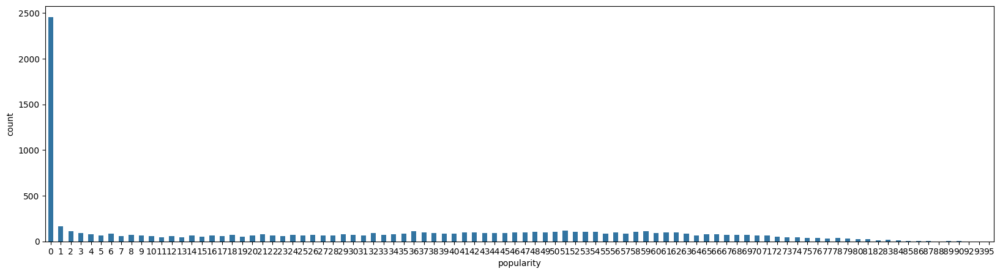

In [32]:
plt.figure(figsize=(20, 5))
sns.countplot(x="popularity", data=df_subset, width=0.5)

L'histogramme de la popularité des musiques met en évidence **qu'il y a un profond problème de déséquilibre de quantité de données numériques discrètes (i.e. il y a une très grande présence de 0 que de chacune des autres catégories). En effet, on peut voir que dans ce jeu de données certaines popularités sont beaucoup plus rare que d'autres**. Ainsi cela présenterait un problème pour la régression plus tard dans l'exercice. Nous mettrons en place des méthodes et des modèles qui permettent de réduire l'influence de ce phénomène.

Par l'observation des diagrammes à barres de quelques variables, on observe la présence d'outliers et pour certaines variables cette présence est très grande. Cependant, on ne va pas retirer ces colonnes, car la présence de beaucoup d'outliers pourraient être caractéristiques de la prépondérance d'une popularité comme 0 typiquement.

In [33]:
numerical_columns = [
    "danceability",
    "energy",
    "loudness",
    "speechiness",
    "acousticness",
    "instrumentalness",
    "liveness",
    "valence",
    "tempo",
]
for name in numerical_columns:
    fig = px.box(df_subset[name], y=name, points="outliers")
    fig.show()

Cependant, une des catégories est problématique pour la régression de ces données. En effet, la catégorie genres regroupent des élements string qui ont une structure de liste contenant des genres et sous-genres de musiques. Entraîner un modèle directement avec ces données provoqueraient de très mauvaises performances, car ceux sont des données très complexes. 

C'est pour cela que l'on a décidé de traiter cette colonne en effectuant **un sorte de OneHotEncoder**. L'idée est que l'on va extraire l'ensemble des catégories de genre de musique et on va binariser les données selon ces genres. Cela va augmenter le nombre de colonnes et rendre plus simple les calculs pour les modèles de régression.

In [34]:
# Extraction de la liste des genres uniques
genres = df_subset["genres"].tolist()
for i, element in enumerate(genres):
    genres[i] = literal_eval(element)
listeDesGenres = list(set([item for sousListe in genres for item in sousListe]))

# Création des colonnes
indiceGenres = df_subset.columns.get_loc("genres")

# Insertion des colonnes ainsi que leurs données binaires
for g in listeDesGenres:
    df_subset.insert(indiceGenres, g, [int(g in sousListe) for sousListe in genres])

/tmp/ipykernel_1535894/210384336.py:12: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_1535894/210384336.py:12: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_1535894/210384336.py:12: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_1535894/210384336.py:12: Per

Nous pouvons nous permettre de supprimer la colonne "genres" qui n'est plus nécessaire, ainsi que la colonne "id" qui ne donne pas plus d'informations pour les modèles. En effet, "id" est une clé primaire pour ce jeu de données, donc chacune de ces ids sont uniques.

In [35]:
# Pas de duplicas pour les ids de ce jeu de données
df_subset["id"].duplicated().sum()

0

In [36]:
df_subset = df_subset.drop("genres", axis=1)
df_subset = df_subset.drop("id", axis=1)

In [37]:
df_subset

,artist_name,track_name,release_date,french techno,indietronica,oceania soundtrack,livetronica,deep underground hip hop,yodeling,east coast reggae,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
0,Marry,Vorglühn Nachglühn,2018-10-12,0,0,0,0,0,0,0,...,-2.557,1,0.1690,0.036800,0.000000,0.3230,0.509,144.968,174631,4
1,ABBA,Chiquitita,1979,0,0,0,0,0,0,0,...,-8.108,1,0.0354,0.734000,0.000004,0.3120,0.372,84.229,326320,4
2,Drug Squad,Dangerous Trouble,2010-08-09,0,0,0,0,0,0,0,...,-9.954,1,0.0465,0.187000,0.785000,0.3560,0.478,185.689,277053,4
3,Ahmad Jamal,Poinciana,1958-05-23,0,0,0,0,0,0,0,...,-9.277,1,0.0282,0.495000,0.661000,0.8730,0.570,97.980,487201,4
4,Korn,Make Me Bad,1999-11-01,0,0,0,0,0,0,0,...,-6.693,0,0.0363,0.000122,0.037000,0.2490,0.424,110.038,235493,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8693,Yseult,Corps,2019-10-18,0,0,0,0,0,0,0,...,-11.719,0,0.0386,0.937000,0.000574,0.1020,0.131,77.784,313184,1
8694,Sheff G,Weight On Me,2020-05-15,0,0,0,0,0,0,0,...,-6.198,0,0.2220,0.707000,0.000043,0.1250,0.626,121.959,157619,4
8695,Yugo Kanno,il vento d'oro,2018-12-19,0,0,0,0,0,0,0,...,-4.834,1,0.1430,0.006520,0.125000,0.0906,0.582,134.947,295576,4
8696,Anlaya Project,Baltica,2018-05-14,0,0,0,0,0,0,0,...,-9.507,1,0.0703,0.002730,0.025800,0.0737,0.141,128.017,512000,4


On constate que l'on est passé d'une vingtaine de colonnes à 1763 colonnes. Le problème est devenu un problème de grandes dimensions, ce qui guidera la recherche des modèles à utiliser.

#### Le traitement des données

Comme pour le premier exercice, les données de la colonne "release_date" se présentent sur plusieurs formats. 
Ces formats sont : 
* "%Y-%m-%d"
* "%Y-%m"
* "%Y"

In [38]:
df_subset["release_date"]

0       2018-10-12
1             1979
2       2010-08-09
3       1958-05-23
4       1999-11-01
           ...    
8693    2019-10-18
8694    2020-05-15
8695    2018-12-19
8696    2018-05-14
8697    2018-07-18
Name: release_date, Length: 8698, dtype: object

On les convertit en entier, puis on les normalise selon la méthode MinMax.

In [39]:
# Isolation de la colonne release_date
df_date = df_subset[["release_date"]]

# Les différents formats de date
format1 = "%Y-%m-%d"
format2 = "%Y-%m"
format3 = "%Y"

# Traitement des dates de sortie selon leur format et conversion en entier
for index, date in enumerate(df_date["release_date"]):
    if len(date) == len("YYYY-mm-dd"):
        df_date["release_date"][index] = (
            datetime.datetime.strptime(date, format1)
            .replace(tzinfo=datetime.timezone.utc)
            .timestamp()
        )
    elif len(date) == len("YYYY-mm"):
        df_date["release_date"][index] = (
            datetime.datetime.strptime(date, format2)
            .replace(tzinfo=datetime.timezone.utc)
            .timestamp()
        )
    elif len(date) == len("YYYY"):
        df_date["release_date"][index] = (
            datetime.datetime.strptime(date, format3)
            .replace(tzinfo=datetime.timezone.utc)
            .timestamp()
        )

# Reshape les données pour le MinMaxScaler
df_time = df_date
timestamps = df_time["release_date"].values.reshape(-1, 1)

# Application de MinMaxScaler et normalisation des timestamps entre 0 et 1
scaler = MinMaxScaler()
df_time["normalized_timestamp"] = scaler.fit_transform(timestamps)

# Remplacement des anciennes valeurs de la colonne release_date
df_subset["release_date"] = df_time["normalized_timestamp"]

# On vérifie qu'après traitement des date de sortie, nous n'avons toujours pas de données des NaN
df_time["release_date"].isna().sum()

/tmp/ipykernel_1535894/2795226759.py:12: FutureWarning:

ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


/tmp/ipykernel_1535894/2795226759.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in t

0

On constate qu'il n'y a pas de données NaN après ce prétraitement.

In [40]:
df_subset

,artist_name,track_name,release_date,french techno,indietronica,oceania soundtrack,livetronica,deep underground hip hop,yodeling,east coast reggae,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
0,Marry,Vorglühn Nachglühn,0.973302,0,0,0,0,0,0,0,...,-2.557,1,0.1690,0.036800,0.000000,0.3230,0.509,144.968,174631,4
1,ABBA,Chiquitita,0.647343,0,0,0,0,0,0,0,...,-8.108,1,0.0354,0.734000,0.000004,0.3120,0.372,84.229,326320,4
2,Drug Squad,Dangerous Trouble,0.906311,0,0,0,0,0,0,0,...,-9.954,1,0.0465,0.187000,0.785000,0.3560,0.478,185.689,277053,4
3,Ahmad Jamal,Poinciana,0.478451,0,0,0,0,0,0,0,...,-9.277,1,0.0282,0.495000,0.661000,0.8730,0.570,97.980,487201,4
4,Korn,Make Me Bad,0.818051,0,0,0,0,0,0,0,...,-6.693,0,0.0363,0.000122,0.037000,0.2490,0.424,110.038,235493,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8693,Yseult,Corps,0.981626,0,0,0,0,0,0,0,...,-11.719,0,0.0386,0.937000,0.000574,0.1020,0.131,77.784,313184,1
8694,Sheff G,Weight On Me,0.986337,0,0,0,0,0,0,0,...,-6.198,0,0.2220,0.707000,0.000043,0.1250,0.626,121.959,157619,4
8695,Yugo Kanno,il vento d'oro,0.974828,0,0,0,0,0,0,0,...,-4.834,1,0.1430,0.006520,0.125000,0.0906,0.582,134.947,295576,4
8696,Anlaya Project,Baltica,0.969915,0,0,0,0,0,0,0,...,-9.507,1,0.0703,0.002730,0.025800,0.0737,0.141,128.017,512000,4


Nous séparons ensuite les caractéristiques des musiques et leur popularité.

In [41]:
X_subset = df_subset.drop("popularity", axis=1, inplace=False)
y_subset = df_subset["popularity"]

Enfin, nous allons normaliser et encoder l'ensemble des données. Le principe de ce traitement est d'encoder les données catégorielles en nombres grâce à l'ordinal encoder, puis de tout normaliser d'un coup (sauf les genres qui sont deja normalisés). Pour cela on sépare les colonnes en catégorielles et numériques, on a l'encodeur ordinal et le standard scaler. On fait tous dans une pipeline qui encode tout d'un coup. On a fait ce choix de prétraitement pour les raisons suivantes : 
* Convergence plus rapide : Lorsque les données sont normalisées, les algorithmes d'optimisation utilisés pour entraîner les modèles de régression peuvent converger plus rapidement. 
* Réduction du risque de valeurs aberrantes : La normalisation peut rendre le modèle de régression moins sensible aux valeurs aberrantes.
* Stabilité numérique : Certains algorithmes numériques utilisés dans les modèles de régression peuvent être plus stables lorsque les données sont normalisées, ce qui peut réduire les risques de problèmes numériques lors de l'entraînement du modèle.
* Échelle uniforme : La normalisation met toutes les variables à la même échelle. Cela est important pour les modèles de régression qui sont sensibles aux échelles des variables.

In [44]:
colonnesNumeriques = X_subset.select_dtypes(include=["float64", "int64"]).columns
colonnesCategorielles = X_subset.select_dtypes(include=["object"]).columns

encNum = StandardScaler()
encCat = OrdinalEncoder()

preprocesseur = ColumnTransformer(
    transformers=[
        (
            "num",
            encNum,
            [col for col in colonnesNumeriques if col not in listeDesGenres],
        ),
        ("cat", encCat, [col for col in colonnesCategorielles]),
    ]
)

pipeline = Pipeline(steps=[("preprocesseur", preprocesseur)])

X_subset_scale = pipeline.fit_transform(X_subset)

colonnesTransformees = [
    col for col in colonnesNumeriques if col not in listeDesGenres
] + [f"{col}_encoded" for col in colonnesCategorielles]

X_subset_normalized = pd.DataFrame(X_subset_scale, columns=colonnesTransformees)

In [45]:
X_subset_normalized

,release_date,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,artist_name_encoded,track_name_encoded
0,0.749682,0.802752,1.152270,0.185260,1.213570,0.789152,0.729166,-0.688273,-0.508973,0.765717,0.016971,0.774065,-0.619855,0.186504,2908.0,7945.0
1,-1.864896,-0.519389,-0.512687,1.021622,-0.031031,0.789152,-0.636853,1.603851,-0.508960,0.698202,-0.513684,-1.374087,0.989072,0.186504,55.0,1324.0
2,0.212334,-2.554789,0.568228,-1.208677,-0.444926,0.789152,-0.523359,-0.194473,2.213823,0.968264,-0.103105,2.214242,0.466509,0.186504,1336.0,1669.0
3,-3.219604,0.083693,-0.216307,1.021622,-0.293134,0.789152,-0.710470,0.818111,1.783726,4.141499,0.253248,-0.887756,2.695496,0.186504,115.0,5624.0
4,-0.495613,-0.362819,0.524642,1.579197,0.286229,-1.267183,-0.627650,-0.808856,-0.380638,0.311521,-0.312268,-0.461302,0.025693,0.186504,2514.0,4546.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8693,0.816445,-0.513590,-2.007662,-0.093527,-0.840660,-1.267183,-0.604134,2.271236,-0.506982,-0.590733,-1.447172,-1.602027,0.849742,-8.961326,5218.0,1513.0
8694,0.854236,1.226068,-0.604216,-0.651102,0.397214,-1.267183,1.271075,1.515085,-0.508825,-0.449564,0.470158,-0.039693,-0.800297,0.186504,4020.0,8111.0
8695,0.761919,-0.571578,1.060741,1.579197,0.703039,0.789152,0.463324,-0.787822,-0.075407,-0.660704,0.299728,0.419653,0.662978,0.186504,5222.0,8602.0
8696,0.722508,0.275055,-0.111703,-1.208677,-0.344703,0.789152,-0.280011,-0.800282,-0.419485,-0.764432,-1.408438,0.174560,2.958532,0.186504,236.0,637.0


#### La visualisation des données avec les méthodes ACP et t-SNE

On constate que par la matrice de corrélation de ces données traitées la décorrélation entre beaucoup de colonnes. Cependant, on peut relever les corrélations fortes suivantes : 
* acousticness/energy : corrélation négative de -0.68
* loudness/energy : corrélation positive de 0.75
* acousticness/loudness : corrélation négative de -0.56

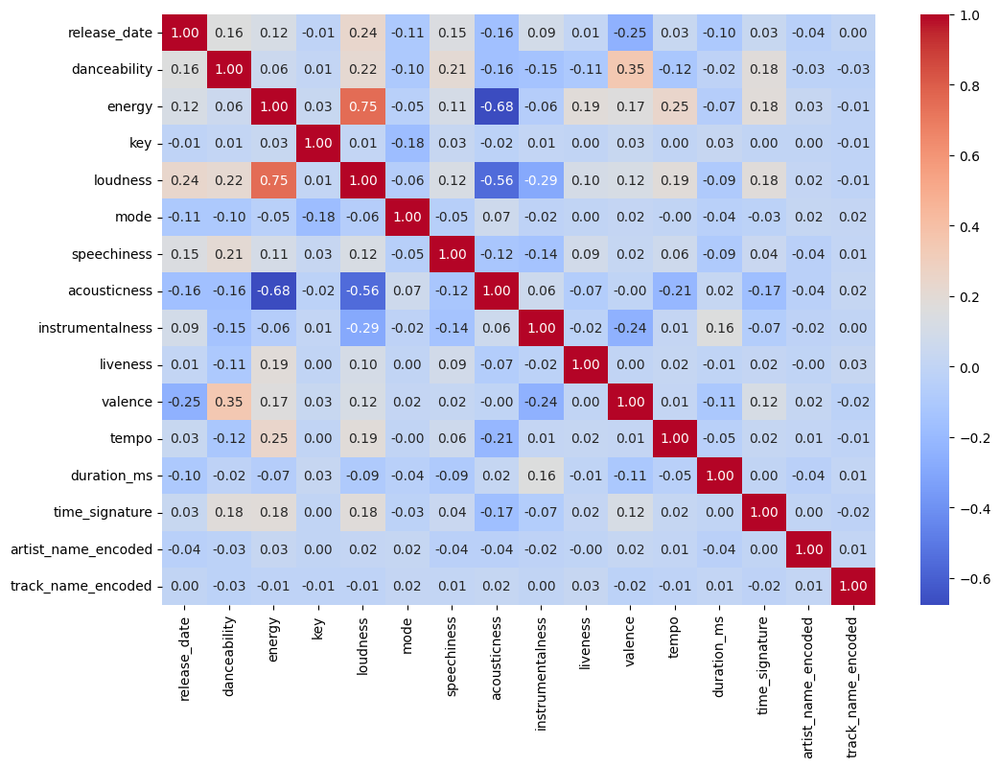

In [46]:
matriceCovariance = X_subset_normalized.corr()
plt.figure(figsize=(12, 8))
sns.heatmap(matriceCovariance, annot=True, cmap="coolwarm", fmt=".2f")
plt.show()

Comme on le constate avec l'exercice 1, en ayant des variables très décorrélés, on obtient une ACP et t-SNE qui ne puissent pas correctement séparer les données en plus petites dimensions.

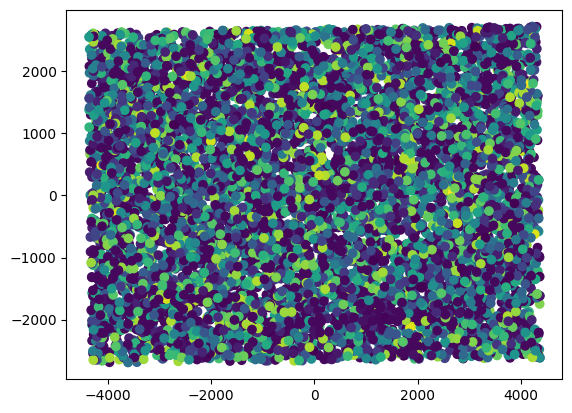

In [47]:
acpSubset = PCA(n_components=2)

X_projected_2D_pca = acpSubset.fit_transform(X_subset_normalized)

colonnePopularite = y_subset

plt.scatter(
    X_projected_2D_pca[:, 0],
    X_projected_2D_pca[:, 1],
    c=colonnePopularite.factorize()[0],
)
plt.show()

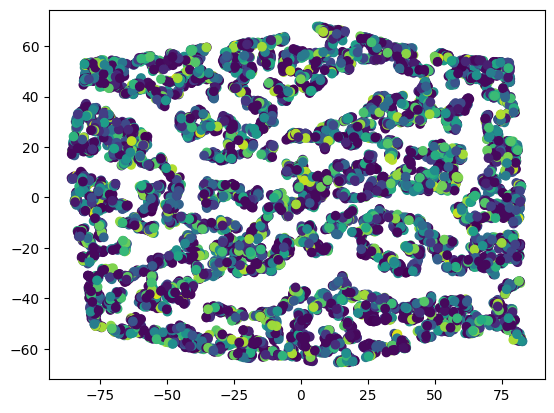

In [48]:
tsneSubset = TSNE(n_components=2)
X_tsneSubset = tsneSubset.fit_transform(X_subset_normalized)

plt.scatter(X_tsneSubset[:, 0], X_tsneSubset[:, 1], c=colonnePopularite.factorize()[0])
plt.show()

On voit si un algorithme de clustering comme le KMeans puisse rassembler les musiques d'une même popularité ensemble. Cependant au vu du graphe ci-dessous, la meilleur performance est en i=2, c'est_à-dire que KMeans lui aussi n'arrive pas bien à différencier les popularités des musiques.

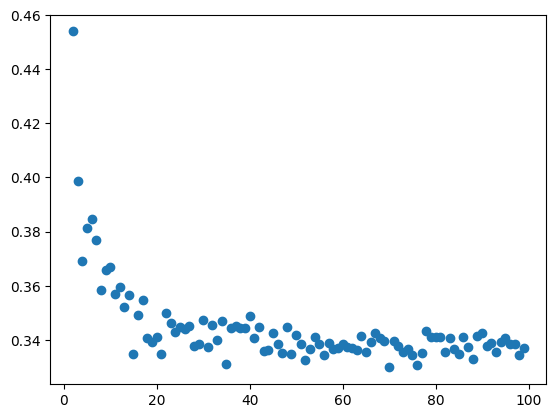

In [49]:
X_silhouette_points = list(range(2, 100))
y_silhouette_points = []

for i in range(2, 100):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(X_subset_normalized)
    labels = kmeans.predict(X_subset_normalized)
    silhouette = silhouette_score(X_subset_normalized, labels)
    y_silhouette_points.append(silhouette)

plt.scatter(X_silhouette_points, y_silhouette_points)
plt.show()

#### Entraînement des différents modèles

On effectue encore une fois un train_test_split sur les données pour diviser un jeu de données test et train.

In [50]:
X_subset_train, X_subset_test, y_subset_train, y_subset_test = train_test_split(
    X_subset_normalized, y_subset, test_size=0.2
)

##### La recherche des hyperparamètres

On se donne cet espace de recherche d'hyperparamètres avec les modèles suivants.

In [51]:
modeles = [
    # ('Ridge' , Ridge() , {'alpha' : [0.1 , 1] , 'solver' : ['auto' , 'svd' , 'lsqr' , 'sag']}) ,
    # ('Lasso' , Lasso() , {'alpha' : [0.1 , 1] , 'tol' : [0.0001 , 0.001] , 'selection' : ['cyclic' , 'random']}) ,
    # ('RegressionLineaire' , LinearRegression() , {"positive" : [True , False]}) ,
    # ('RidgeBayesien' , BayesianRidge() , {'alpha_1' : [1e-6 , 1e-4] , 'alpha_2' : [1e-6 , 1e-4]  , 'lambda_1' : [1e-6 , 1e-4]  , 'lambda_2' : [1e-6 , 1e-4] }) ,
    # ('RegressionLogistique' , LogisticRegression() , {'penalty' : ['l1' , 'l2'] , 'C' : [0.1 , 1] , 'class_weight' : ['balanced' , None] , 'solver' : ['lbfgs , newton-cholesky' , 'sag']}) ,
    # ('Regression SGD' , SGDRegressor() , {'penalty' : ['l1' , 'l2'] , 'learning_rate' : ['constant' , 'invscaling' , 'optimal' , 'adaptive']}) ,
    # ('KernelRidge' , KernelRidge() , {'kernel' : ['linear' , 'laplacian' , 'polynomial' , 'sigmoid'] , 'degree' : [5 , 7]}) ,
    # ('GPR' , GaussianProcessRegressor() , {'alpha' : [0 , 1e-10 , 1e-8]}),
    # ('PLS' , PLSRegression() , {'n_components' : [2 , 3] , 'scale' : [False] , 'tol' : [1e-6 , 1e-5]}),
    # ('RandomForest' , RandomForestRegressor() , {'n_estimators' : [200,300,400,500] ,'max_depth':[50,100], 'criterion' : ['absolute_error' , 'poisson']}) ,
    # ('MLP' , MLPRegressor() , {'solver' : ['lbfgs' , 'sgd' , 'adam']})
]

On réalise la recherche par Gridsearch des meilleurs hyperparamètres pour chaque modèle.

In [52]:
for nomModele, modele, param_grid in modeles:
    print(f"Entraînement et optimisation de {nomModele}...")

    # Parcourons la matrice avec validation croisée
    grid_search = GridSearchCV(modele, param_grid, n_jobs=15)
    grid_search.fit(X_subset_train, y_subset_train)

    # Récupérons le modèle avec les meilleurs hyperparamètres
    meilleurModele = grid_search.best_estimator_

    # Faisons une prédiction
    y_subset_pred = meilleurModele.predict(X_subset_test)

    # Evaluons le modèle
    MAE = mean_absolute_error(y_subset_test, y_subset_pred)
    RMSE = mean_squared_error(y_subset_test, y_subset_pred, squared=False)

    # Affichons les résultats
    print(f"Model: {nomModele}")
    print(f"Best Hyperparameters: {grid_search.best_params_}")
    print(f"MAE: {MAE}")
    print(f"RMSE: {RMSE}")
    print("------------------------------------")

|Model               |Best Hyperparameters                                                        |MAE               |RMSE              |
|--------------------|----------------------------------------------------------------------------|------------------|------------------|
|Ridge               |{'alpha': 1, 'solver': 'svd'}                                               |21.605314635187455|24.80493554827028 |
|Lasso               |{'alpha': 0.1, 'selection': 'random', 'tol': 0.001}                         |21.641235641850653|24.809978042388845|
|RegressionLineaire  |N/A                                                                         |21.605211455659905|24.80493884220816 |
|RidgeBayesien       |{'alpha_1': 0.0001, 'alpha_2': 1e-06, 'lambda_1': 1e-06, 'lambda_2': 0.0001}|21.640001998141923|24.806840246200235|
|RegressionLogistique|{'C': 0.1, 'class_weight': None, 'penalty': 'l2', 'solver': 'sag'}          |28.204597701149424|38.482478473004925|
|Regression SGD      |{'learning_rate': 'adaptive', 'penalty': 'l1'}                              |55129343932796.35 |59159729454962.13 |
|KernelRidge         |{'degree': 5, 'kernel': 'linear'}                                           |22.201833286112837|26.14687437751512 |
|GPR                 |{'alpha': 1e-08}                                                            |30.03152635954986 |40.14658056316063 |
|PLS                 |{'n_components': 3, 'scale': False, 'tol': 1e-06}                           |22.88185078870151 |26.018333652587803|
|RandomForest        |{'criterion': 'poisson', 'max_depth': 50, 'n_estimators': 300}              |**19.619715549088124**|22.95249542655285 |
|MLP                 |{'solver': 'adam'}                                                          |21.777688750465312|25.54520620611684|

On constate que le meilleur modèle de régression est le RandomForest avec **un MAE de 19.62 et un RMSE de 22.95**, selon la configuration suivante : 
* criterion = poisson 
* max_depth = 50
* n_estimators = 300

Nous allons par la suite observer les tendances de notre meilleur modèles pour la prédiction des popularité. L'idée est de voir les boîtes à moustaches de chacune des popularités et les interprétées.

#### Constat des prédictions

In [53]:
# On choisi le meilleur des modèles et on l'entraîne
best_clf = RandomForestRegressor(criterion="poisson", max_depth=50, n_estimators=300)
best_clf.fit(X_subset_train, y_subset_train)

RandomForestRegressor(criterion='poisson', max_depth=50, n_estimators=300)

In [54]:
# On réalise la prédiction sur les données de test
predictions = best_clf.predict(X_subset_test)

In [55]:
# On rassemble la prédiction et la vérité dans un seul DataFrame
df_compare = pd.DataFrame(
    {"predictions": list(np.round(predictions)), "verite": list(y_subset_test)}
)
df_compare.head(10)

,predictions,verite
0,63.0,42
1,20.0,22
2,44.0,63
3,40.0,0
4,20.0,32
5,32.0,42
6,14.0,78
7,28.0,41
8,17.0,0
9,21.0,36


On constate, sur cet exemple, qu'une partie des prédictions suivent une même tendance que la vérité.

In [56]:
px.box(df_compare, x="verite", y="predictions")

Ce graphique montre pour chaque ensemble de chansons ayant la même vraie popularité une boite à moustache représentant l'ensemble des prédictions de popularité associé.

On remarque qu'il y a une tendance globale linéaire dans la prédiction de chacune des popularités. Cependant, cette tendance est accompagné pour certaines zones d'une très forte distance interquartile, ainsi que des outliers. Cette remarque est particulièrement vrai pour la popularité "0", où il y a l'une des plus grande distance interquartile et le plus d'outliers.

#### Conclusion

Comme pour le premier exercice, il s'agit d'un problème complexe au regard de la qualité des données en amont, ainsi que pour la recherche des modèles qui puissent correctement prédire la popularité d'une musique connaissant les contraintes techniques (i.e. la puissance de calcul de nos machines et de Google Colab). Dans le cas où on aurait eu assez de données, on aurait pu se lancer sur la recherche d'une architecture optimale d'un réseau de neurones, ainsi que la recherche de ses hyperparamètres.

## Exercice 3 : La recommandation de musique - un problème des plus proche voisins

L'objectif ici est de fournir en sortie une liste de musiques recommandées, grâce à une musique ou une liste de musique en entrée. Pour cela, nous conjecturons que deux musiques similaires auront une appréciation similaire par l'utilisateur.
  
Nous allons prétraiter et analyser un ensemble de données sur des musiques, afin de prédire des recommandations grâce à un algorithme des plus proches voisins. Puis nous réfléchirons sur l'utilisation de données propres à l'utilisateur pour améliorer notre modèle et à la pertinence de notre hypothèse initiale.

In [58]:
# Le téléchargement du jeu de données
# Sous Google Colab
# df_recommandation = pd.read_csv("/content/drive/MyDrive/Colab_Notebooks/dataset/recommendation_spotify.csv")

# En local
df_recommandation = pd.read_csv("./dataset/recommendation_spotify.csv")

#### La description des données

Comme pour les autres exercices, nous allons faire une description synthétique de la base de données.

In [59]:
df_recommandation.head()

,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,valence,year
0,0.991000,['Mamie Smith'],0.598,168333,0.224,0,0cS0A1fUEUd1EW3FcF8AEI,0.000522,5,0.3790,-12.628,0,Keep A Song In Your Soul,12,1920,0.0936,149.976,0.6340,1920
1,0.643000,"[""Screamin' Jay Hawkins""]",0.852,150200,0.517,0,0hbkKFIJm7Z05H8Zl9w30f,0.026400,5,0.0809,-7.261,0,I Put A Spell On You,7,1920-01-05,0.0534,86.889,0.9500,1920
2,0.993000,['Mamie Smith'],0.647,163827,0.186,0,11m7laMUgmOKqI3oYzuhne,0.000018,0,0.5190,-12.098,1,Golfing Papa,4,1920,0.1740,97.600,0.6890,1920
3,0.000173,['Oscar Velazquez'],0.730,422087,0.798,0,19Lc5SfJJ5O1oaxY0fpwfh,0.801000,2,0.1280,-7.311,1,True House Music - Xavier Santos & Carlos Gomi...,17,1920-01-01,0.0425,127.997,0.0422,1920
4,0.295000,['Mixe'],0.704,165224,0.707,1,2hJjbsLCytGsnAHfdsLejp,0.000246,10,0.4020,-6.036,0,Xuniverxe,2,1920-10-01,0.0768,122.076,0.2990,1920


In [60]:
df_recommandation.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 174389 entries, 0 to 174388
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   acousticness      174389 non-null  float64
 1   artists           174389 non-null  object 
 2   danceability      174389 non-null  float64
 3   duration_ms       174389 non-null  int64  
 4   energy            174389 non-null  float64
 5   explicit          174389 non-null  int64  
 6   id                174389 non-null  object 
 7   instrumentalness  174389 non-null  float64
 8   key               174389 non-null  int64  
 9   liveness          174389 non-null  float64
 10  loudness          174389 non-null  float64
 11  mode              174389 non-null  int64  
 12  name              174389 non-null  object 
 13  popularity        174389 non-null  int64  
 14  release_date      174389 non-null  object 
 15  speechiness       174389 non-null  float64
 16  tempo             17

On observe que l'ensemble des données sont décrites par 19 colonnes dont 2 de type string/date (release_date et year), 2 de type booléen (l'un est un string, l'autre est un booléen), 4 de type string (artists, name et id) et le reste en integer ou float 64. En particulier, on remarque que d'après la description, ce jeu de données ne contient aucune valeur null.

On vérifie la présence de duplicatas à l'intérieur de ce grand jeu de données.

In [61]:
# Le nombre d'ids qui sont associées à plus d'une musique dans le jeu de données (avec exactement les mêmes caractéristiques)
df_recommandation.duplicated().sum(), df_recommandation["id"].duplicated().sum()

(2159, 2159)

On constate qu'il y a la présence de 2159 duplicatas en commun sur l'ensemble des colonnes et en particulier 37376 dans la colonne "name". Nous devons enlever ces duplicatas, afin de ne pas recommander plusieurs fois les mêmes musiques.

In [62]:
# Le nombre d'artistes qui ont plus qu'une musique dans le jeu de données
df_recommandation["name"].duplicated().sum()

37376

Nous enlevons les duplicatas selon la colonne "id", nous ne gardons que les premières occurences.

In [63]:
df_recommandation = df_recommandation.drop_duplicates(
    subset=["id"], keep="first", ignore_index=True
)

In [64]:
# Vérification des duplicatas
df_recommandation["id"].duplicated().sum(), df_recommandation.duplicated().sum()

(0, 0)

On peut déronavant travailler sans la colonne "id", puisqu'elle est une clé primaire et qu'elle n'apporte aucune information pour la suite de cet exercice.

In [65]:
df_recommandation = df_recommandation.drop(["id"], axis=1)
df_recommandation_original = df_recommandation

#### Traitement des données

Comme pour les deux premiers exercices, les données de la colonne "release_date" se présentent sur plusieurs formats. 
Ces formats sont : 
* "%Y-%m-%d"
* "%Y-%m"
* "%Y"

In [66]:
df_recommandation["release_date"]

0               1920
1         1920-01-05
2               1920
3         1920-01-01
4         1920-10-01
             ...    
172225    2021-01-22
172226    2021-01-22
172227    2021-01-22
172228    2021-01-22
172229    2021-01-07
Name: release_date, Length: 172230, dtype: object

On les convertit en entier, puis on les normalise selon la méthode MinMax.

In [67]:
# Isolation de la colonne release_date
df_date = df_recommandation[["release_date"]]

# Les différents formats de date
format1 = "%Y-%m-%d"
format2 = "%Y-%m"
format3 = "%Y"

# Traitement des dates de sortie selon leur format et conversion en entier
for index, date in enumerate(df_date["release_date"]):
    if len(date) == len("YYYY-mm-dd"):
        df_date["release_date"][index] = (
            datetime.datetime.strptime(date, format1)
            .replace(tzinfo=datetime.timezone.utc)
            .timestamp()
        )
    elif len(date) == len("YYYY-mm"):
        df_date["release_date"][index] = (
            datetime.datetime.strptime(date, format2)
            .replace(tzinfo=datetime.timezone.utc)
            .timestamp()
        )
    elif len(date) == len("YYYY"):
        df_date["release_date"][index] = (
            datetime.datetime.strptime(date, format3)
            .replace(tzinfo=datetime.timezone.utc)
            .timestamp()
        )
    else:
        print(0)
        break

# Reshape les données pour le MinMaxScaler
df_time = df_date
timestamps = df_time["release_date"].values.reshape(-1, 1)

# Application de MinMaxScaler et normalisation des timestamps entre 0 et 1
scaler = MinMaxScaler()
df_time["normalized_timestamp"] = scaler.fit_transform(timestamps)

# Remplacement des anciennes valeurs de la colonne release_date
df_recommandation["release_date"] = df_time["normalized_timestamp"]

# On vérifie qu'après traitement des date de sortie, nous n'avons toujours pas de données des NaN
df_time["release_date"].isna().sum()

/tmp/ipykernel_1535894/2188321621.py:24: FutureWarning:

ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


/tmp/ipykernel_1535894/2188321621.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in t

/tmp/ipykernel_1535894/2188321621.py:18: FutureWarning:

ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


/tmp/ipykernel_1535894/2188321621.py:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in t

0

Conservons la date maximium et minimum pour la visualisation avec l'ACP et le t-SNE, car dans ce jeu de données il n'y a pas de colonne target.

In [69]:
dateMax = df_recommandation["year"].max()
dateMin = df_recommandation["year"].min()
print(f"Dates comprises entre {dateMin} et {dateMax}")

Dates comprises entre 1920 et 2021


Nous encodons ensuite les colonnes name et artists à l'aide d'un OrdinalEncoder.

In [70]:
enc = OrdinalEncoder()
df_recommandation["artists"] = enc.fit_transform(
    np.array(df_recommandation["artists"]).reshape(-1, 1)
)
df_recommandation["name"] = enc.fit_transform(
    np.array(df_recommandation["name"]).reshape(-1, 1)
)

Avant de normaliser, nous enlever la colonne "year" du jeu de données, car ses informations son contenu dans la colonne "release_date". En effet, le format minimaliste des "release_date" est l'année seule. Puis nous normalisons les données à l'aide d'un StandardScaler.

In [71]:
colonneAnnee = df_recommandation["year"]
df_recommandation = df_recommandation.drop("year", axis=1)

scale = StandardScaler()
df_recommandation = pd.DataFrame(
    scale.fit_transform(X=df_recommandation), columns=df_recommandation.columns
)

In [72]:
df_recommandation.head()

,acousticness,artists,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,valence
0,1.289127,0.242119,0.351159,-0.437155,-0.944703,-0.270019,-0.583968,-0.058102,0.927729,-0.149421,-1.539048,-0.206215,-0.636855,-2.122287,-0.067174,1.090704,0.411326
1,0.371872,-1.740375,1.795506,-0.560361,0.132378,-0.270019,-0.506250,-0.058102,-0.722324,0.793798,-1.539048,-0.442746,-0.865514,-2.121878,-0.286782,-0.992011,1.606526
2,1.294399,0.242119,0.629793,-0.467771,-1.084393,-0.270019,-0.585483,-1.479429,1.702662,-0.056277,0.649752,-0.660264,-1.002709,-2.122287,0.372044,-0.638405,0.619351
3,-1.322485,0.571071,1.101764,1.286995,1.165346,-0.270019,1.820066,-0.910898,-0.461614,0.785011,0.649752,1.302004,-0.408197,-2.122287,-0.346328,0.365103,-1.827027
4,-0.545383,0.405450,0.953918,-0.458279,0.830826,3.703442,-0.584797,1.363224,1.055040,1.009084,-1.539048,1.552177,-1.094172,-2.094296,-0.158950,0.169631,-0.855738


#### Visualisation des données avec les méthodes ACP et t-SNE

On a souhaité examiner les relations entre les différentes variables du jeu de données à travers une matrice de corrélation. On observe une corrélation forte entre l'énergie et le volume, ce qui semble logique. De plus, on constate une corrélation positive entre la popularité et la date. En d'autres termes, l'algorithme de recommandation aurait tout intérêt à proposer des musiques plus récentes qu'anciennes s'il devait être calibré sur la popularité des musiques plutôt que sur celles appréciées par l'utilisateur, ce qui est notre cas.

<Axes: >

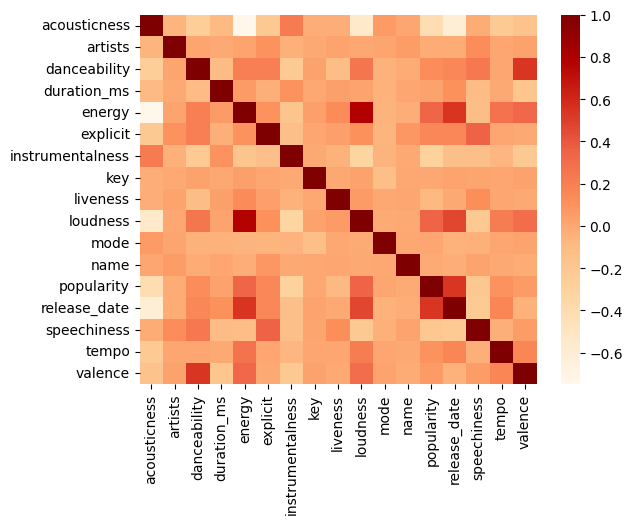

In [73]:
sns.heatmap(df_recommandation.corr(), cmap="OrRd", annot=False)

Nous pouvons espérer de l'ACP et du t-SNE une meilleur représentation des données en plus petites dimensions, au regard d'un bon nombre de corrélation entre variables à l'intérieur de cette base de données.

/tmp/ipykernel_1535894/1732058843.py:13: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



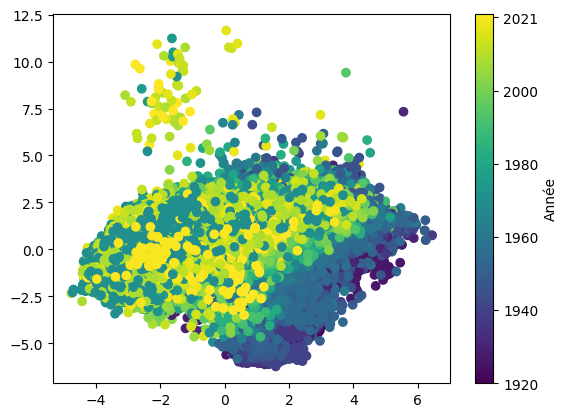

In [74]:
acpRecommandation = PCA(n_components=2)

X_projected_2D_acp = acpRecommandation.fit_transform(df_recommandation)

plt.scatter(
    X_projected_2D_acp[:, 0],
    X_projected_2D_acp[:, 1],
    c=colonneAnnee.factorize()[0],
    cmap="viridis",
)
cbar = plt.colorbar()
cbar.set_label("Année")
cbar.set_ticklabels([int(dateMin + i * (dateMax - dateMin) / 5) for i in range(6)])
plt.show()

On observe qu'avec l'ACP, en plus petite dimension, les musiques sont correctement regroupées selon leurs années. On voit que si l'on se place à droite en bas, il y a là les musiques les plus veilles (datant de 1980), contrairement en haut à gauche avec des musiques de 2021. Cependant, on peut voir que les plus anciennes musiques sont moins bien représentées dans cette espace (superposition avec les autres musiques plus récentes).

/tmp/ipykernel_1535894/732980364.py:7: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



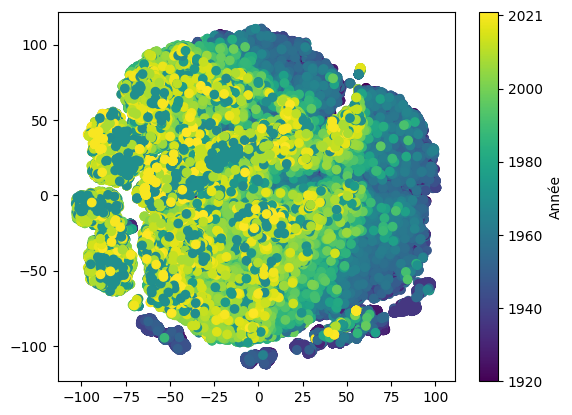

In [76]:
tsne = TSNE(n_components=2)
X_tsne = tsne.fit_transform(df_recommandation)

plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=colonneAnnee.factorize()[0], cmap="viridis")
cbar = plt.colorbar()
cbar.set_label("Année")
cbar.set_ticklabels([int(dateMin + i * (dateMax - dateMin) / 5) for i in range(6)])
plt.show()

Cependant, la même observation ne peut être conduite pour les données avec le t-SNE, il y a plus une superposition des données en 2 dimensions datant de 1920 avec 1980. Malgré cela, nous allons tester notre méthode de recommandation avec les données prétraitées, celles venant de l'ACP et du t-SNE, car on estime à la vue des graphes que les données sont suffisament bien regroupées.

#### Méthode de recommandation

Il existe plusieurs méthodes de recommandation dans la littérature qui pourraient résoudre notre problème. A la vue du volume des données, l'utilisation d'un réseau de neurones (Neural Collaborative Filtering) semble envisageable pour recommander des musiques à l'utilisateur, à condition que celui-ci note ou donne son avis sur les musiques. Une autre méthode fréquemment utilisée est l'algorithme **Apriori**, qui, en connaissant l'historique de l'utilisateur, peut recommander une liste de musiques avec une certaine probabilité d'erreur. Cependant, toutes ces méthodes reposent sur des variables liées à l'utilisateur, ce qui n'est pas le cas de notre base de données. En effet, il serait incorrect de se baser sur la popularité des musiques pour recommander, car la colonne "popularity" reflète l'avis de plusieurs personnes sur chaque musique et non celui de la personne concernée. C'est pourquoi nous optons pour l'algorithme des K plus proches voisins (KNN) brute, car il est mieux adapté à un problème en petites dimensions et à l'absence de données nécessitant l'intervention d'un utilisateur.

Notre objectif est de trouver les 10 plus proches voisins d'une musique ou d'une liste de musiques. Nous avons généralisé directement au cas d'une liste de musiques en choisissant le barycentre des musiques sous la forme de vecteurs prétraités. En effet, si nous devions calculer les plus proches voisins pour chaque musique d'une liste, nous ne pourrions pas mettre en place un algorithme de recommandation de musiques parmi ces choix sans l'intervention de l'utilisateur. Dans notre cas, l'utilisateur nous présente simplement un ensemble de musiques. En ce qui concerne une unique chanson, le barycentre est égal au vecteur représentant cette chanson.

Par la suite, nous avons opté pour la distance euclidienne comme métrique pour évaluer la similarité entre deux musiques. Ce choix repose sur le fait que cette distance permet de donner de l'importance à chaque caractéristique des vecteurs représentant les musiques, et que les données sont normalisées. Contrairement, par exemple, à la distance de Manhattan qui convient lorsque les dimensions ont des échelles différentes ou lorsque les caractéristiques catégorielles sont importantes.

In [ ]:
distance = "euclidean"

Nous allons voir s'il vaut mieux effectuer un KNN sur les données prétraitées, que ce soit celles issues de l'ACP ou du t-SNE. Nous allons, par exemple, chercher les 10 plus proches voisins des trois premières musiques de notre base de données.

In [ ]:
indicesChansons = np.random.randint(0, 42, size=100)
N = 10
vecteurs = df_recommandation.iloc[indicesChansons]
barycentre = np.mean(vecteurs, axis=0)

D'abord nous devons obtenir les dix vrais plus proches voisins obtenu grâce au KNN brute sur les données prétraitées seulement.

In [ ]:
# On effectue le KNN
knn = NearestNeighbors(n_neighbors=N, algorithm="brute", metric=distance)
knn.fit(df_recommandation)

# indicesAuBarycentre est la liste des indices des recommandations
distancesAuBarycentre_brute, indicesAuBarycentre_true = knn.kneighbors([barycentre])
df_recommandation.iloc[:, indicesAuBarycentre_true]

C:\Users\ElieS\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\base.py:465: UserWarning:

X does not have valid feature names, but NearestNeighbors was fitted with feature names



Nous allons ensuite obtenir les 10 plus proches voisins selon la méthode KNN brute avec les données de l'ACP et du t-SNE.

In [ ]:
# On a besoin que les données soit sous formes de dataframe pour les traiter plus facilement
X_projected_2D_pca = pd.DataFrame(X_projected_2D_pca)

# Sélectionnons les chansons de la liste prédéfinie dans la dataframe
vecteurs_pca = X_projected_2D_pca.iloc[indicesChansons]


barycentre_pca = np.mean(vecteurs_pca, axis=0)

# On effectue le KNN
knn_pca = NearestNeighbors(n_neighbors=N, algorithm="brute", metric=distance)
knn_pca.fit(X_projected_2D_pca)

# indicesAuBarycentre est la liste des indices des recommandations
distancesAuBarycentre_pca, indicesAuBarycentre_pca = knn_pca.kneighbors(
    [barycentre_pca]
)
print(indicesAuBarycentre_pca)
df_recommandation.iloc[:, indicesAuBarycentre_pca]

In [ ]:
# On a besoin que les données soit sous formes de dataframe pour les traiter plus facilement
X_tsne = pd.DataFrame(X_tsne)

# Sélectionnons les chansons de la liste prédéfinie dans la dataframe
vecteurs_tsne = X_tsne.iloc[indicesChansons]

barycentre_tsne = np.mean(vecteurs_tsne, axis=0)

# On effectue le KNN
knn_tsne = NearestNeighbors(n_neighbors=N, algorithm="brute", metric=distance)
knn_tsne.fit(X_tsne)

# indicesAuBarycentre est la liste des indices des recommandations
distancesAuBarycentre_tsne, indicesAuBarycentre_tsne = knn_tsne.kneighbors(
    [barycentre_tsne]
)
print(indicesAuBarycentre_tsne)
df_recommandation.iloc[:, indicesAuBarycentre_tsne]

Nous devons ensuite établir une fonction d'erreur qui mesure à la qualité des plus proches voisins selon l'ACP et le t-SNE.
Nous proposons la forme la plus courante d'une fonction d'erreur : 

Soit L notre fonction d'erreur, N la taille de la liste, y_true la vérité, y_pred la prédiction : 

$$ L(y_{true},y_{pred}) = \frac{\Sigma_{i=1}^{N} \mathbb{1}_{y_{pred}[i] \neq y_{true}[i]}}{N} $$ 

In [ ]:
# La mesure de l'erreur
def err(y_true, y_pred):
    return (
        np.sum(
            [
                element_true != element_pred
                for element_true, element_pred in zip(y_true, y_pred)
            ]
        )
        / N
    )


err(indicesAuBarycentre_true, indicesAuBarycentre_pca), err(
    indicesAuBarycentre_true, indicesAuBarycentre_tsne
)

(1.0, 1.0)

On constate que l'erreur est bien trop importante pour permettre la recommandation via des données obtenues par l'ACP et le t-SNE. Ainsi notre méthode de recommandation est le KNN brute avec les données prétraitées seulement.

Enfin, on pourrait étendre ce modèle pour prendre en compte l'expérience de tous les utilisateurs en effectuant un KNN brute non pas sur les données des musiques, mais sur les profils des utilisateurs, et en recommandant des chansons qui n'ont pas été écoutées par l'utilisateur, d'un autre utilisateur similaire. Sinon on pourrait mettre dans la base de données un historique des utilisateurs similaires à celui précédemment étudié et mettre en place un algorithme Apriori pour recommander des musiques.

#### Conclusion

Dans le but d'améliorer le modèle, on pourrait :  
  
- Modifier le barycentre utilisé lors du KNN en prenant en compte la liste de toutes les chansons écoutées par la personne, puis pondérer ce barycentre par le nombre de fois où ces musiques ont été écoutées lors des 6 derniers mois. Dans ce cas, il faudra que la pondération de la chanson ou de la liste de chansons initiale soit plus élevée car elle reste la plus importante.

- Avoir accès aux informations de l'utilisateur sur d'autres services qui pourraient encore plus influencer la recommandation des musiques. C'est une méthode employé par Google, YouTube et encore bien d'autres services pour personnaliser tous types de recommandation à notre compte utilisateur.

- Rajouter le temps d'écoute médian de l'utilisateur à notre base de données pour approfondir l'analyse et améliorer les résultats.   

Les recommandations peuvent avoir plusieurs objectifs : 
- Faire écouter encore une chanson à l'utilisateur.
- Faire en sorte que l'utilisateur ajoute une chanson à sa playlist.
- Convaincre l'utilisateur de la valeur de Spotify (avec des musiques exclusives par exemple);
- Piquer la curiosité de l'utilisateur (avec des chansons plus originales).

En fonction des objectifs de Spotify, les paramètres du modèle ne seront pas forcément les mêmes. De plus, des politiques de respect de la vie privé peuvent aussi influer sur ce que l'algorithme peut utiliser en tant que données. 

Enfin, une bonne recommandation ne reflète pas forcément une similarité avec d'autres chansons et utilisateurs. Il est peut-être pertinent d'ajouter des chansons aléatoires, de temps en temps, pour améliorer l'expérience utilisateur et ne pas le restreindre à un seul genre de musique.

## Conclusion 

Nous avons apprécié être confrontés à des problèmes complexes et réalistes en Machine Learning. En effet, en entreprise, nous n'avons pas toujours le luxe d'avoir des données toujours corrélées, ni des représentations simplifiées par des méthodes de réduction facilitant les manipulations. Cependant, cela a été l'opportunité de nous plonger à nouveau dans la littérature afin d'identifier les méthodes les plus efficaces pour résoudre ce type de problème.